In [130]:
# import libraries

import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline 
 # what is this?
matplotlib.rcParams['figure.figsize'] = (12, 8) # adjust the configuration of the plots we will create

#read in the data
# df = pd.read_csv('C:\\Users\\niehu\\OneDrive - University of St. Thomas\\MsDS\\A0 - Projects\\Movie - Jupyter\\movies.csv')

df = pd.read_csv(r'C:\Users\niehu\OneDrive - University of St. Thomas\MsDS\A0 - Projects\Movie - Jupyter\movies.csv')


In [131]:
# let's look at the data
# df.head()

# check for missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}'.format(col, pct_missing))


name - 0.0
rating - 0.010041731872717789
genre - 0.0
year - 0.0
released - 0.0002608242044861763
score - 0.0003912363067292645
votes - 0.0003912363067292645
director - 0.0
writer - 0.0003912363067292645
star - 0.00013041210224308815
country - 0.0003912363067292645
budget - 0.2831246739697444
gross - 0.02464788732394366
company - 0.002217005738132499
runtime - 0.0005216484089723526


In [132]:
# shape
df.shape

(7668, 15)

In [133]:
#data types
df.dtypes
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [134]:
# change data type of the budget column

# df['gross'] = df['gross'].astype('int64') error message: Cannot convert non-finite values (NA or inf) to integer

df['budget'] = df['budget'].astype('float')
df['gross'] = df['gross'].astype('float')


In [135]:
# convert the 'released' column to date and year only, create a new column for it.

df['release_year'] = df['released'].apply(lambda x: str(x).split('(')[0].split(',')[-1]).str.replace(r'\D', '')

# df['release_year'] = df['release_year'].astype('int64')

pd.set_option('display.max_rows', None) 
df['release_year']
# apply    (lambda x: str(x).split('(')[0].split(',')[-1])


0       1980
1       1980
2       1980
3       1980
4       1980
5       1980
6       1980
7       1980
8       1981
9       1980
10      1980
11      1984
12      1980
13      1980
14      1980
15      1980
16      1980
17      1980
18      1980
19      1980
20      1980
21      1981
22      1980
23      1980
24      1980
25      1980
26      1980
27      1980
28      1980
29      1980
30      1980
31      1980
32      1980
33      1981
34      1980
35      1980
36      1980
37      1980
38      1980
39      1980
40      1981
41      1980
42      1980
43      1980
44      1980
45      1980
46      1980
47      1980
48      1980
49      1981
50      1980
51      1980
52      1980
53      1980
54      1981
55      1980
56      1980
57      1980
58      1980
59      1981
60      1980
61      1980
62      1981
63      1980
64      1980
65      1980
66      1980
67      1980
68      1980
69      1980
70      1980
71      1980
72      1980
73      1980
74      1980
75      1980
76      1980

In [136]:
# to look at all data
pd.set_option('display.max_rows', None) 

In [137]:
# drop duplicates
# df['company'].drop_duplicates().sort_values(ascending=False)

#df.drop_duplicates

#df

In [138]:
# df.dtypes

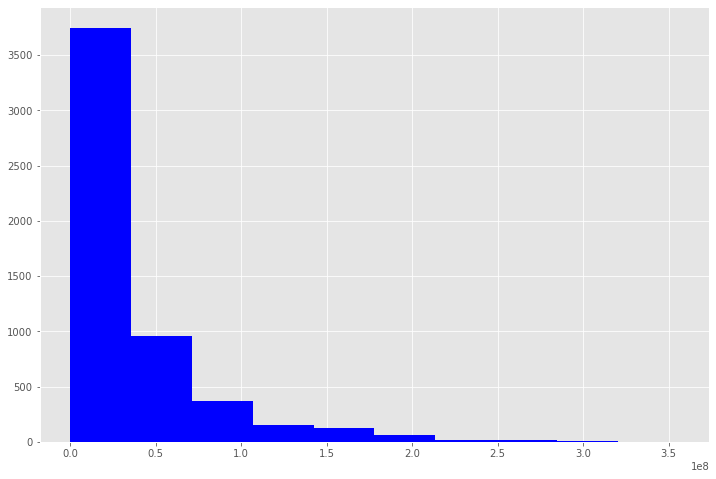

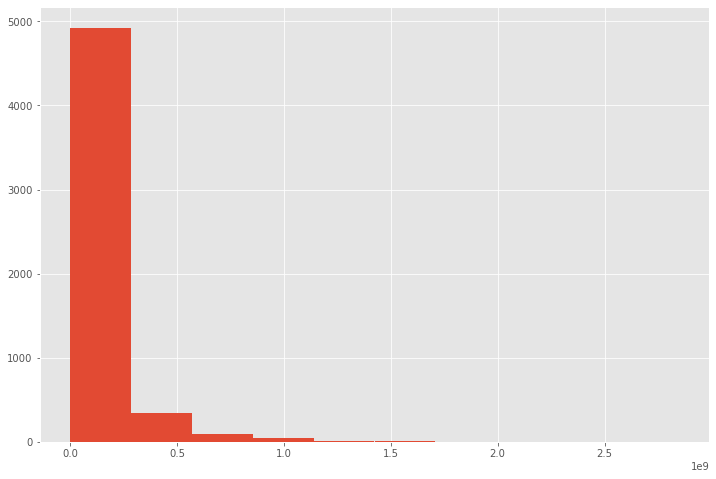

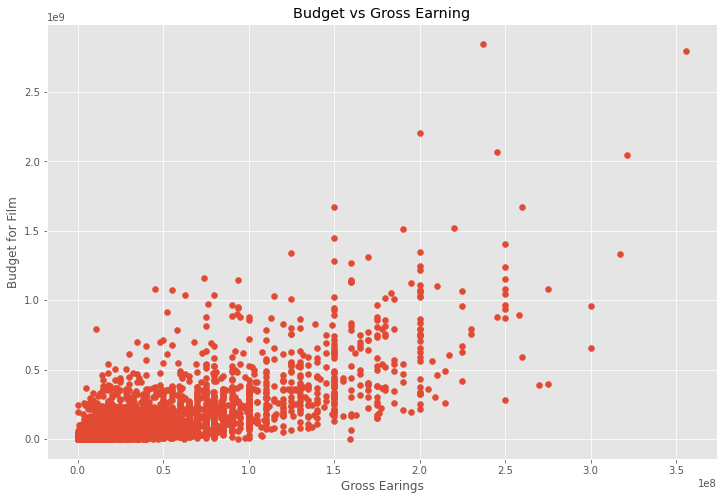

In [139]:
# Scatterplot between Budget and Gross
# company high correlation
# build a scatterplot with budget v.s. gross revenue


# df['budget'].isnull - This has treated all budgets as null.

# change data type of columns -- budget,gross  
# ValueError: Cannot convert non-finite values (NA or inf) to integer
# col is NULL so can't be transfer to int 

# df['budget'] = df['budget'].fillna(0).astype('int64')
# df['gross'] = df['gross'].fillna(0).astype('int64')
# df['votes'] = df['votes'].fillna(0).astype('int64')

df = df[pd.notnull(df['budget'])]
df = df[pd.notnull(df['gross'])]

plt.hist(df['budget'], color = 'blue')
plt.show()
plt.hist(df['gross'])
plt.show()


plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget vs Gross Earning')
plt.xlabel('Gross Earings')
plt.ylabel('Budget for Film')
plt.show()


In [140]:
df.sort_values(by = ['gross'], inplace = False, ascending = False)


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_year
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000.0,1.670728e+09,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000.0,1.670516e+09,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000.0,1.518816e+09,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000.0,1.515341e+09,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000.0,1.450027e+09,Walt Disney Animation Studios,103.0,2019


<AxesSubplot:xlabel='budget', ylabel='gross'>

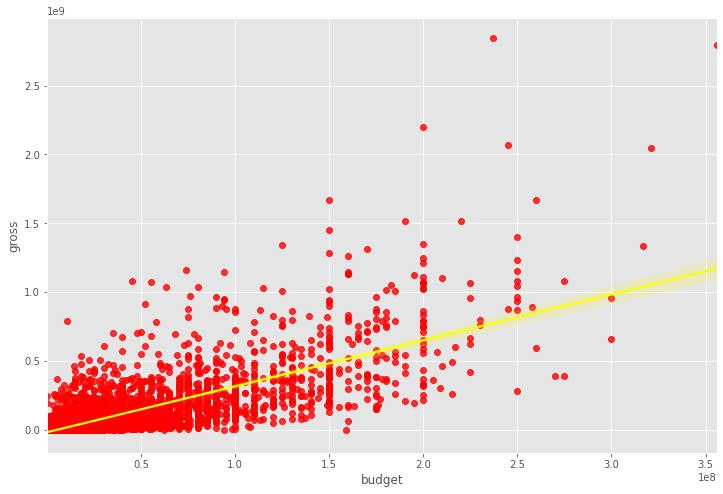

In [141]:
# plot budget v.s gross using seaborn
# No loop matching the specified signature and casting error - convert datatype to float

# df['budget'] = df['budget'].astype('float')
# df['gross'] = df['gross'].astype('float')

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws = {"color": "yellow"})

In [142]:
# correlation
df.corr(method = 'pearson') # only work on numerical fields
# pearson, kendall, spearman
# df.corr(method = 'kendall')
# df.corr(method = 'spearman')


,year,score,votes,budget,gross,runtime
year,1.000000,0.055174,0.205758,0.327781,0.274264,0.074203
score,0.055174,1.000000,0.473809,0.071792,0.222143,0.414580
votes,0.205758,0.473809,1.000000,0.440021,0.614904,0.352437
budget,0.327781,0.071792,0.440021,1.000000,0.740395,0.318595
gross,0.274264,0.222143,0.614904,0.740395,1.000000,0.275596
runtime,0.074203,0.414580,0.352437,0.318595,0.275596,1.000000


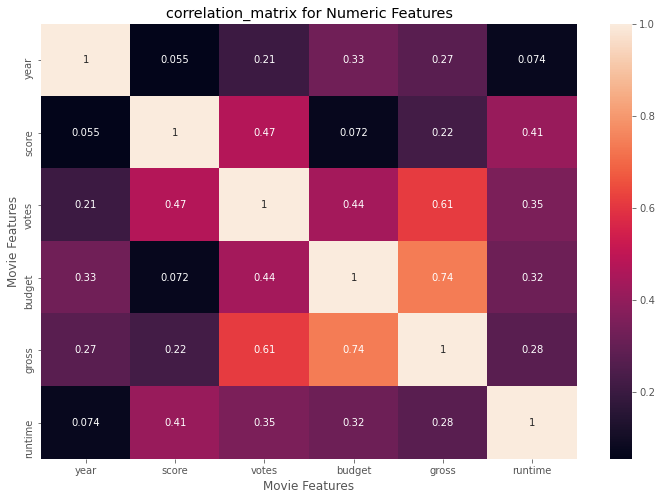

In [143]:
#visualize the corr table

correlation_matrix = df.corr(method = 'pearson')
sns.heatmap(correlation_matrix, annot = True)

plt.title('correlation_matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()


In [144]:
# look at company

df.dtypes
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0,1980


In [145]:
df_numerized = df
for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype =='object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes 
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_year
0,4706,6,6,1980,1308,8.4,927000.0,1800,2841,700,46,19000000.0,4.699877e+07,1432,146.0,0
1,3943,6,1,1980,1131,5.8,65000.0,1581,1160,215,47,4500000.0,5.885311e+07,454,104.0,0
2,3654,4,0,1980,1363,8.7,1200000.0,759,1822,1161,47,18000000.0,5.383751e+08,949,124.0,0
3,205,4,4,1980,1131,7.7,221000.0,891,1416,1478,47,3500000.0,8.345354e+07,1114,88.0,0
4,734,6,4,1980,1174,7.3,108000.0,721,352,272,47,6000000.0,3.984634e+07,1089,98.0,0
5,1513,6,9,1980,1928,6.4,123000.0,1763,3091,156,47,550000.0,3.975460e+07,1114,95.0,0
6,3944,6,0,1980,1363,7.9,188000.0,976,578,861,47,27000000.0,1.152299e+08,1403,133.0,0
7,3134,6,3,1980,531,8.2,330000.0,1272,1259,1473,47,18000000.0,2.340243e+07,392,129.0,0
8,3745,4,0,1980,1350,6.8,101000.0,1611,1405,596,47,54000000.0,1.081857e+08,550,127.0,1
9,4415,6,3,1980,1760,7.0,10000.0,2017,281,403,47,10000000.0,1.579519e+07,1397,100.0,0


In [146]:
df.dtypes

name              int16
rating             int8
genre              int8
year              int64
released          int16
score           float64
votes           float64
director          int16
writer            int16
star              int16
country            int8
budget          float64
gross           float64
company           int16
runtime         float64
release_year       int8
dtype: object

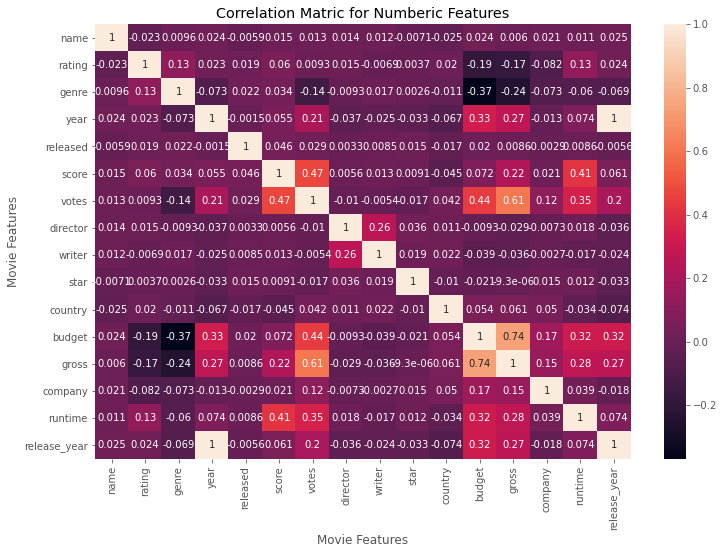

In [147]:

correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)
plt.title('Correlation Matric for Numberic Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [148]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_year
name,1.000000,-0.023013,0.009617,0.024435,-0.005896,0.014955,0.012915,0.013699,0.011602,-0.007109,-0.024555,0.023698,0.005966,0.021209,0.010800,0.024734
rating,-0.023013,1.000000,0.128102,0.022668,0.018836,0.059550,0.009255,0.014847,-0.006923,0.003737,0.020148,-0.186892,-0.168814,-0.082189,0.133239,0.023634
genre,0.009617,0.128102,1.000000,-0.073026,0.021712,0.034061,-0.136457,-0.009303,0.017500,0.002619,-0.010847,-0.368900,-0.244380,-0.073293,-0.060186,-0.068848
year,0.024435,0.022668,-0.073026,1.000000,-0.001481,0.055174,0.205758,-0.036936,-0.024568,-0.032770,-0.066662,0.327781,0.274264,-0.013062,0.074203,0.998641
released,-0.005896,0.018836,0.021712,-0.001481,1.000000,0.046424,0.029029,0.003341,0.008514,0.015363,-0.017231,0.019888,0.008614,-0.002927,0.008619,-0.005625
score,0.014955,0.059550,0.034061,0.055174,0.046424,1.000000,0.473809,0.005573,0.012860,0.009121,-0.044690,0.071792,0.222143,0.021054,0.414580,0.061029
votes,0.012915,0.009255,-0.136457,0.205758,0.029029,0.473809,1.000000,-0.010198,-0.005394,-0.017140,0.042146,0.440021,0.614904,0.119366,0.352437,0.202883
director,0.013699,0.014847,-0.009303,-0.036936,0.003341,0.005573,-0.010198,1.000000,0.262940,0.036289,0.011108,-0.009340,-0.029366,-0.007337,0.018082,-0.036281
writer,0.011602,-0.006923,0.017500,-0.024568,0.008514,0.012860,-0.005394,0.262940,1.000000,0.019273,0.022153,-0.039420,-0.035999,-0.002658,-0.016672,-0.024397
star,-0.007109,0.003737,0.002619,-0.032770,0.015363,0.009121,-0.017140,0.036289,0.019273,1.000000,-0.010135,-0.021282,-0.000009,0.015086,0.012439,-0.033168


In [149]:
# view the correlation 
correlation_mat = df_numerized.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs

name          name            1.000000
              rating         -0.023013
              genre           0.009617
              year            0.024435
              released       -0.005896
              score           0.014955
              votes           0.012915
              director        0.013699
              writer          0.011602
              star           -0.007109
              country        -0.024555
              budget          0.023698
              gross           0.005966
              company         0.021209
              runtime         0.010800
              release_year    0.024734
rating        name           -0.023013
              rating          1.000000
              genre           0.128102
              year            0.022668
              released        0.018836
              score           0.059550
              votes           0.009255
              director        0.014847
              writer         -0.006923
              star       

In [150]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

budget        genre          -0.368900
genre         budget         -0.368900
              gross          -0.244380
gross         genre          -0.244380
rating        budget         -0.186892
budget        rating         -0.186892
rating        gross          -0.168814
gross         rating         -0.168814
votes         genre          -0.136457
genre         votes          -0.136457
company       rating         -0.082189
rating        company        -0.082189
country       release_year   -0.073732
release_year  country        -0.073732
company       genre          -0.073293
genre         company        -0.073293
year          genre          -0.073026
genre         year           -0.073026
              release_year   -0.068848
release_year  genre          -0.068848
year          country        -0.066662
country       year           -0.066662
genre         runtime        -0.060186
runtime       genre          -0.060186
country       score          -0.044690
score         country    

In [151]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

gross         votes           0.614904
votes         gross           0.614904
gross         budget          0.740395
budget        gross           0.740395
year          release_year    0.998641
release_year  year            0.998641
name          name            1.000000
company       company         1.000000
gross         gross           1.000000
budget        budget          1.000000
country       country         1.000000
star          star            1.000000
writer        writer          1.000000
director      director        1.000000
votes         votes           1.000000
score         score           1.000000
released      released        1.000000
year          year            1.000000
genre         genre           1.000000
rating        rating          1.000000
runtime       runtime         1.000000
release_year  release_year    1.000000
dtype: float64